# Part 1

10993
10993
[0.00000000e+00 9.09669790e-05 1.81933958e-04 ... 9.99727099e-01
 9.99818066e-01 9.99909033e-01]


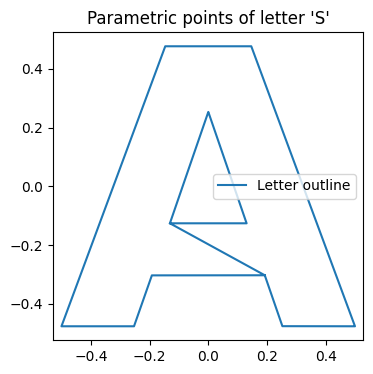

In [1]:
import numpy as np
import matplotlib.pyplot as plt

pts = np.loadtxt(r'C:\Users\aadii\OneDrive\Desktop\Github\IIScFirstSem\Numerical_Methods\Assignment4\A.csv',
                 delimiter=',', skiprows=1)

#Obtain x and y:
x = pts[:,0]
y = pts[:,1]

#Construct complex representation:
z = x + 1j*y

#Now, constructing the parameter values as given:
N = len(z)
print(N)
#11000 entries it seems
t = np.arange(N)/N #These are the parameters
print(len(t))
print(t)

plt.figure(figsize=(4, 4))
plt.plot(x, y, '-', label="Letter outline")
plt.axis('equal')
plt.title("Parametric points of letter 'S'")
plt.legend()
plt.show()
#Alright, so the letter A is shown


# Part 2: Fourier Coefficients

In [2]:

#From Assignment 3, I will take my composite trapezoidal code
#It's not the exact code, there are a few changes to be made
#Alright so, we need to calculate the fourier series coeff.
#z => Calculated, t=> parameters, calculated, k=> -M to M
#Some integer frequency index?

# c = []
# M = 128
# N = 10994
# #What is k?
# k = 1 
# summ = 0
# #So this is how the first fourier coefficient, c1 was calculated
# for j in range(0,10993):
#     summ += z[j]*np.exp(-2j*np.pi*t[j]*k)
# summ = summ/10994
# temp = summ
# #Lets do from -127 till -1:
# for k in range(-127,0):
#     summ = 0
#     for j in range(0,10993):
#         summ += z[j]*np.exp(-2j*np.pi*t[j]*k)
#     summ = summ/10994
#     c.append(summ)
# c.append(temp)
# #Now, from 1 till 127
# for k in range(1,128):
#     summ = 0
#     for j in range(0,10993):
#         summ += z[j]*np.exp(-2j*np.pi*t[j]*k)
#     summ = summ/10994
#     c.append(summ)
# print(c)

#Now, let me make the above code efficient
N = len(z)   # use actual sample count
M = 128
c_list = []   # coefficients in order k = -M .. +M
h = (1-0)/N
for k in range(-M, M+1):          # includes k = 0 and k = ±M
    #Start and end:
    end_contrib = 0.5 * (z[0] * np.exp(-2j * np.pi * k * t[0]) +
                         z[-1] * np.exp(-2j * np.pi * k * t[-1]))
    #Interior sum
    summ = 0+0j
    for j in range(1,N-1): #For each data point
        summ += z[j] * np.exp(-2j * np.pi * k * t[j]) #Incrementally Sum f(t)
    
    c_k = (summ+end_contrib) * h #h times the summation, analogous to the composite trapezoidal rule
    c_list.append(c_k)
#This is the inbuilt functionality of python:
# N = len(z)
# h = 1.0 / N
# M = 128
# ks = np.arange(-M, M+1)
# c_list = []
# for k in ks:
#     f = z * np.exp(-2j * np.pi * k * t)        # f_j = z_j * e^{-i 2π k t_j}
#     trapz_sum = 0.5 * f[0] + np.sum(f[1:-1]) + 0.5 * f[-1]
#     c_k = h * trapz_sum
#     c_list.append(c_k)
# c_trapz = c_list.copy()
# 1) max absolute difference
# diff = c_periodic - c_trapz
# max_abs = np.max(np.abs(diff))

# # 2) relative to mean magnitude of coefficients
# mean_mag = np.mean(np.abs(c_trapz))
# rel_max = max_abs / (mean_mag + 1e-30)

# # 3) L2 relative error
# rel_l2 = np.linalg.norm(diff) / (np.linalg.norm(c_trapz) + 1e-30)
# print("max_abs =", max_abs)
# print("relative (max/mean_mag) =", rel_max)
# print("relative L2 =", rel_l2)
# In all 3 metrics, my manually computed value was roughly similar
# I think my manually implemented composite trapezoidal rule is good enough

#Sanity Check:
ks = list(range(-M, M+1))
print("computed coefficients for k from", ks[0], "to", ks[-1], " -> total:", len(c_list))
print("c_0 =", c_list[ks.index(0)])
print("c_1 =", c_list[ks.index(1)])
print("c_-1 =", c_list[ks.index(-1)])

#So apparently what I did was a kind of composite trapezoidal rule
#We first discretized the integral into a summation, multiplied by step size
#so now we are ready to obtain the entire summation


computed coefficients for k from -128 to 128  -> total: 257
c_0 = (0.00014783296370406517-0.14177016779268323j)
c_1 = (-0.06590584325184788+0.08421863841143136j)
c_-1 = (-0.08196152430350696-0.15339023602905982j)


# Curve Reconstruction & Vis

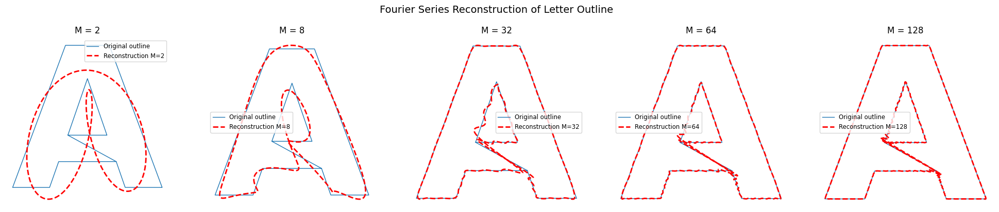

In [3]:
#So, we have to now construct A with formula 5
N = 1000

#This was the above function for fourier coeff:
def fourier_coeff(z,t,M):
    c_list = []   # coefficients in order k = -M .. +M
    z = np.asarray(z, dtype=np.complex128) #Convert this into an array with complex entries
    t = np.asarray(t, dtype=np.float64) #Allow float values for t
    N = z.shape[0]
    h = (1.0-0)/N
    ks = np.arange(-M,M+1)
    for k in ks:
    #Start and end:
        end_contrib = 0.5 * (z[0] * np.exp(-2j * np.pi * k * t[0]) +
                         z[-1] * np.exp(-2j * np.pi * k * t[-1]))
        #Interior sum
        summ = 0+0j
        for j in range(1,N-1): #For each data point
            summ += z[j] * np.exp(-2j * np.pi * k * t[j]) #Incrementally Sum f(t)
        
        c_k = (summ+end_contrib) * h #h times the summation, analogous to the composite trapezoidal rule
        c_list.append(c_k)
    return ks, np.array(c_list)
#Let's say we want z(2) of t:
# coeff = fourier_coeff(2,N,t)
# print(len(coeff),len(t))
# z_two = []
# for i in range(0,N):
#     #Need to obtain z[i]
#     summ = 0
#     for k in range(-2,3):
#         coeff_k=coeff[k+2]
#         summ += coeff_k*np.exp(2j*np.pi*k*t[i])
#     z_two.append(summ)

#Now, doing this for all the values of M:
# assume z and t are defined and len(t) == N == len(z)
def reconstruct(ks,coeff,t):
    N = len(t)    # will store z_recons[M] = array of length Nout (here we use same N)
    z = []
    M = (len(ks)-1)/2
    for i in range(N):
        summ = 0 + 0j
        for k in ks:
            coeff_k = coeff[int(k + M)]    # shift index by M
            summ += coeff_k * np.exp(2j * np.pi * k * t[i])
        z.append(summ)
    return np.array(z, dtype=np.complex128)


#Visualizing it
import matplotlib.pyplot as plt

Ms = [2, 8, 32, 64, 128]

z_recons = {}
for M in Ms:
    ks, coeff = fourier_coeff(z, t, M)   # compute coeffs from original samples
    z_M_out = reconstruct(ks, coeff, t)      # evaluate at dense t_out for smooth plot
    z_recons[M] = z_M_out

M_values = Ms

fig, axes = plt.subplots(1, len(M_values), figsize=(20, 4))  # 1 row, 5 columns

for ax, M in zip(axes, M_values):
    # original outline (use original z samples)
    ax.plot(z.real, z.imag, '-', lw=1, label='Original outline', zorder=1)
    # reconstructed outline (from your z_recons dict)
    ax.plot(z_recons[M].real, z_recons[M].imag, '--', lw=2, color='red',
            label=f'Reconstruction M={M}', zorder=2)

    ax.set_aspect('equal')     # equal scale on x and y
    ax.set_title(f'M = {M}')
    ax.axis('off')             # optional: hide axis ticks/labels for clean look
    ax.legend(fontsize='small')

fig.suptitle("Fourier Series Reconstruction of Letter Outline", fontsize=14, y=1.02)
plt.tight_layout()
plt.show()

#Took 47 seconds to run!!!


# Animation

Saving GIF with PillowWriter...
Saved GIF to: fourier_arm_anim.gif


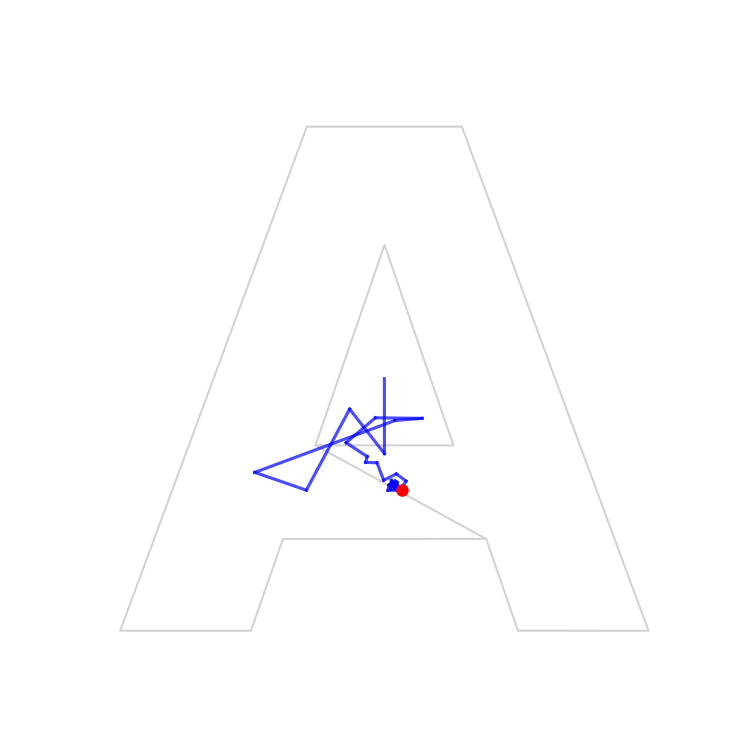

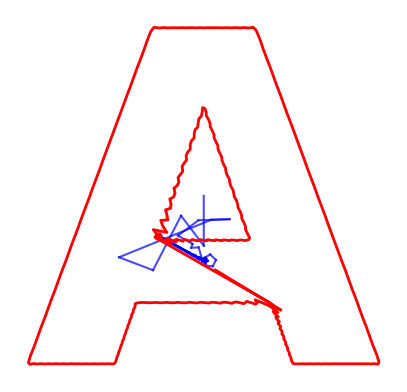

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, Image, display

t_samples = t
# Reconstructor
def synth(ks, c, t_eval):
    t_eval = np.asarray(t_eval, dtype=np.float64)
    exp_mat = np.exp(2j * np.pi * ks[:, None] * t_eval[None, :])
    z_eval = np.sum(c[:, None] * exp_mat, axis=0)
    return z_eval

# Parameters
M = 128
N_frames = 400
fps = 24
interval = int(1000 / fps)

# Compute Fourier coefficients
ks, coeff = fourier_coeff(z, t_samples, M)
t_anim = np.linspace(0.0, 1.0, N_frames, endpoint=False)

# precompute trace
z_anim = synth(ks, coeff, t_anim)

# Order of arm segments: 0, +1, -1, +2, -2, ...
order = [0]
for k in range(1, M + 1):
    order.extend([k, -k])

# Map from k to index in coeff
idx_of_k = {int(k): i for i, k in enumerate(ks)}

# ---- Plot setup ----
fig, ax = plt.subplots(figsize=(5, 5))
ax.set_aspect("equal")
ax.axis("off")

# Determine limits (slightly padded)
all_x = np.concatenate([z.real, z_anim.real])
all_y = np.concatenate([z.imag, z_anim.imag])
pad = 0.05 * max(all_x.ptp(), all_y.ptp(), 1e-3)
ax.set_xlim(all_x.min() - pad, all_x.max() + pad)
ax.set_ylim(all_y.min() - pad, all_y.max() + pad)

# Original outline (reference)
ax.plot(z.real, z.imag, color="lightgray", lw=1)

# Arm segments: create one line per frequency
arm_lines = []
for _ in order:
    (ln,) = ax.plot([], [], lw=1.5, color="blue", alpha=0.7)
    arm_lines.append(ln)

# Trace of end effector
trace_line, = ax.plot([], [], lw=2, color="red")
head_dot, = ax.plot([], [], "o", color="red", markersize=5)

# Animation functions
def init():
    for ln in arm_lines:
        ln.set_data([], [])
    trace_line.set_data([], [])
    head_dot.set_data([], [])
    return arm_lines + [trace_line, head_dot]


def update(frame):
    tval = t_anim[frame]
    cur = 0 + 0j  # base is at origin
    endpoints = [cur]
    # sequentially compute vector sums for each link
    for k in order:
        c_k = coeff[idx_of_k[k]]
        vec = c_k * np.exp(2j * np.pi * k * tval)
        nxt = cur + vec
        endpoints.append(nxt)
        cur = nxt

    # update all arm segments
    for i, ln in enumerate(arm_lines):
        ln.set_data([endpoints[i].real, endpoints[i+1].real],
                    [endpoints[i].imag, endpoints[i+1].imag])

    # end effector (final tip)
    end = endpoints[-1]

    # update trace
    trace_line.set_data(z_anim[:frame+1].real, z_anim[:frame+1].imag)
    head_dot.set_data([end.real], [end.imag])

    return arm_lines + [trace_line, head_dot]



anim = animation.FuncAnimation(
    fig, update, frames=N_frames, init_func=init,
    interval=interval, blit=True, repeat=True
)

# Display in notebook (JSHTML)
display(HTML(anim.to_jshtml()))

# Saving animation as GIF
out_gif = "fourier_arm_anim.gif"
try:
    from matplotlib.animation import PillowWriter
    print("Saving GIF with PillowWriter...")
    writer = PillowWriter(fps=fps)
    anim.save(out_gif, writer=writer, dpi=150)
    print("Saved GIF to:", out_gif)
    display(Image(filename=out_gif))
except Exception as e_pillow:
    print("PillowWriter failed with error:", e_pillow)
    print("Attempting ImageMagickWriter fallback (requires ImageMagick installed)...")
    try:
        from matplotlib.animation import ImageMagickWriter
        out_gif_im = "fourier_arm_anim_imagemagick.gif"
        writer = ImageMagickWriter(fps=fps)
        anim.save(out_gif_im, writer=writer, dpi=150)
        print("Saved GIF via ImageMagick to:", out_gif_im)
        display(Image(filename=out_gif_im))
    except Exception as e_im:
        print("ImageMagick fallback also failed:", e_im)
        print("If both fail, try installing Pillow (`pip install pillow`) or install ImageMagick and ensure it's on PATH.")
